# Mount Google Drive in Google Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Required Libraries and YOLO

In [15]:
import os
from pathlib import Path
import random
import shutil
import yaml
from ultralytics import YOLO

# Define Dataset Paths and Check Dataset Contents

In [3]:
datasetPath = "/content/drive/MyDrive/Traffic_Dataset"
imagesDir = os.path.join(datasetPath, "images")
labelsDir = os.path.join(datasetPath, "labels")
print("Dataset:", datasetPath)
print("Images:", imagesDir)
print("Labels:", labelsDir)
print("\nNumber of images:",
      len(os.listdir(imagesDir)))
print("Number of label files:",
      len(os.listdir(labelsDir)))

Dataset: /content/drive/MyDrive/Traffic_Dataset
Images: /content/drive/MyDrive/Traffic_Dataset/images
Labels: /content/drive/MyDrive/Traffic_Dataset/labels

Number of images: 1151
Number of label files: 1152


# Verify Image and Label File Matching

In [4]:
image_files = {
    Path(f).stem
    for f in os.listdir(imagesDir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
}

label_files = {
    Path(f).stem
    for f in os.listdir(labelsDir)
    if f.lower().endswith(".txt") and f != "classes.txt"
}

missing_labels = image_files - label_files
extra_labels = label_files - image_files

print("Images:", len(image_files))
print("Labels:", len(label_files))

print("\nImages without labels:", len(missing_labels))
print("Labels without images:", len(extra_labels))

if missing_labels:
    print("\nMissing labels:")
    print(list(missing_labels)[:20])

if extra_labels:
    print("\nLabels without images:")
    print(list(extra_labels)[:20])

Images: 1151
Labels: 1151

Images without labels: 0
Labels without images: 0


In [5]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 6.9 MB/s eta 0:00:00


In [6]:
import ultralytics
print("Ultralytics version:", ultralytics.__version__)

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics version: 8.4.120


# Check PyTorch and GPU Availability

In [7]:
import torch
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


# Create YOLO Dataset Directory Structure

In [8]:
YOLO_DATASET = "/content/drive/MyDrive/TrafficObj_YOLO"

for folder in [
    "images/train",
    "images/val",
    "images/test",
    "labels/train",
    "labels/val",
    "labels/test"
]:
    os.makedirs(os.path.join(YOLO_DATASET, folder), exist_ok=True)

print("YOLO dataset folders created.")

YOLO dataset folders created.


# Split Dataset into Training, Validation, and Testing Sets

In [9]:
random.seed(42)

# Get image files
images = [
    f for f in os.listdir(imagesDir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

random.shuffle(images)

total = len(images)

train_count = int(total * 0.70)
val_count = int(total * 0.20)

train_images = images[:train_count]
val_images = images[train_count:train_count + val_count]
test_images = images[train_count + val_count:]

print("Total:", total)
print("Train:", len(train_images))
print("Validation:", len(val_images))
print("Test:", len(test_images))

Total: 1151
Train: 805
Validation: 230
Test: 116


# Copy Images and Labels into YOLO Train, Validation, and Test Folders

In [10]:
def copy_split(files, split):
    for image_name in files:
        image_path = os.path.join(imagesDir, image_name)

        label_name = Path(image_name).stem + ".txt"
        label_path = os.path.join(labelsDir, label_name)

        destination_image = os.path.join(
            YOLO_DATASET, "images", split, image_name
        )

        destination_label = os.path.join(
            YOLO_DATASET, "labels", split, label_name
        )

        shutil.copy2(image_path, destination_image)
        shutil.copy2(label_path, destination_label)


copy_split(train_images, "train")
copy_split(val_images, "val")
copy_split(test_images, "test")

print("Dataset split completed.")

Dataset split completed.


# Load and Display YOLO Class Names

In [18]:
classesFile = os.path.join(labelsDir, "classes.txt") # in the output not all classes will be considered they are from automatic detection, forgot to remove

with open(classesFile, "r") as f:
    classes = [line.strip() for line in f if line.strip()]

print("Classes:")
for i, className in enumerate(classes):
    print(f"{i}: {className}")

print("\nNumber of classes:", len(classes))

Classes:
0: Bus
1: Truck
2: Stop Sign
3: Car
4: Bicycle
5: bike
6: Train
7: Bench
8: Dining Table
9: Airplane
10: Umbrella
11: Backpack
12: Potted Plant
13: Suitcase
14: Boat
15: Handbag
16: Fire Hydrant
17: Bed
18: Sink
19: Dog
20: Skateboard
21: auto
22: pedestrian

Number of classes: 23


# Define Desired Classes and Remap Original Class IDs

In [19]:
desiredClasses = {
    0: "Bus",
    1: "Truck",
    2: "Car",
    3: "Bicycle",
    4: "bike",
    5: "auto",
    6: "pedestrian"
}

oldToNew = {
    0: 0,    # Bus
    1: 1,    # Truck
    3: 2,    # Car
    4: 3,    # Bicycle
    5: 4,    # bike
    21: 5,   # auto
    22: 6    # pedestrian
}
print("Desired classes:")
for classId, className in desiredClasses.items():
    print(f"{classId}: {className}")

print("\nOld → New mapping:")
for oldId, newId in oldToNew.items():
    print(f"{oldId} ({classes[oldId]}) → {newId} ({desiredClasses[newId]})")

Desired classes:
0: Bus
1: Truck
2: Car
3: Bicycle
4: bike
5: auto
6: pedestrian

Old → New mapping:
0 (Bus) → 0 (Bus)
1 (Truck) → 1 (Truck)
3 (Car) → 2 (Car)
4 (Bicycle) → 3 (Bicycle)
5 (bike) → 4 (bike)
21 (auto) → 5 (auto)
22 (pedestrian) → 6 (pedestrian)


# Clean Labels and Remap Class IDs

In [20]:
def cleanLabels(split):
    labelDir = os.path.join(YOLO_DATASET, "labels", split)

    totalObjects = 0
    keptObjects = 0
    removedObjects = 0

    for fileName in os.listdir(labelDir):

        if not fileName.endswith(".txt"):
            continue

        filePath = os.path.join(labelDir, fileName)

        with open(filePath, "r") as f:
            lines = [line.strip() for line in f if line.strip()]

        newLines = []

        for line in lines:
            parts = line.split()

            if len(parts) != 5:
                print(f"Invalid label in: {fileName}")
                continue

            oldClassId = int(parts[0])
            totalObjects += 1

            # Keep only desired classes
            if oldClassId in oldToNew:

                newClassId = oldToNew[oldClassId]

                parts[0] = str(newClassId)

                newLines.append(" ".join(parts))

                keptObjects += 1

            else:
                # Remove unwanted automatic detections
                removedObjects += 1

        # Rewrite the label file
        with open(filePath, "w") as f:
            if newLines:
                f.write("\n".join(newLines) + "\n")

    print(f"\n{split.upper()}")
    print("Total objects:", totalObjects)
    print("Kept objects:", keptObjects)
    print("Removed objects:", removedObjects)


for split in ["train", "val", "test"]:
    cleanLabels(split)


TRAIN
Total objects: 5074
Kept objects: 5067
Removed objects: 7

VAL
Total objects: 1493
Kept objects: 1492
Removed objects: 1

TEST
Total objects: 753
Kept objects: 752
Removed objects: 1


# Check Cleaned Class Distribution

In [21]:
from collections import Counter

newClassCounts = Counter()

for split in ["train", "val", "test"]:

    labelDir = os.path.join(
        YOLO_DATASET,
        "labels",
        split
    )

    for fileName in os.listdir(labelDir):

        if not fileName.endswith(".txt"):
            continue

        filePath = os.path.join(labelDir, fileName)

        with open(filePath, "r") as f:
            for line in f:

                line = line.strip()

                if not line:
                    continue

                classId = int(line.split()[0])

                newClassCounts[classId] += 1


print("Cleaned class distribution:\n")

for classId, className in desiredClasses.items():

    print(
        f"{classId}: {className:12s} "
        f"→ {newClassCounts[classId]} objects"
    )

Cleaned class distribution:

0: Bus          → 1143 objects
1: Truck        → 48 objects
2: Car          → 415 objects
3: Bicycle      → 100 objects
4: bike         → 951 objects
5: auto         → 4100 objects
6: pedestrian   → 554 objects


# Create YOLO Dataset Configuration File

In [22]:
import yaml

dataYaml = {
    "path": YOLO_DATASET,
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": desiredClasses
}

yamlPath = os.path.join(YOLO_DATASET, "data.yaml")

with open(yamlPath, "w") as f:
    yaml.dump(dataYaml, f, sort_keys=False)

print(open(yamlPath).read())

path: /content/drive/MyDrive/TrafficObj_YOLO
train: images/train
val: images/val
test: images/test
names:
  0: Bus
  1: Truck
  2: Car
  3: Bicycle
  4: bike
  5: auto
  6: pedestrian



In [23]:
print(open(yamlPath).read())

path: /content/drive/MyDrive/TrafficObj_YOLO
train: images/train
val: images/val
test: images/test
names:
  0: Bus
  1: Truck
  2: Car
  3: Bicycle
  4: bike
  5: auto
  6: pedestrian



# Visualize Random Image with YOLO Annotations

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import random

def showAnnotation(split="train"):

    imageDir = os.path.join(YOLO_DATASET, "images", split)
    labelDir = os.path.join(YOLO_DATASET, "labels", split)

    imageNames = [
        f for f in os.listdir(imageDir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    imageName = random.choice(imageNames)

    imagePath = os.path.join(imageDir, imageName)
    labelPath = os.path.join(
        labelDir,
        Path(imageName).stem + ".txt"
    )

    image = Image.open(imagePath)
    width, height = image.size

    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image)

    with open(labelPath, "r") as f:
        lines = [line.strip() for line in f if line.strip()]

    for line in lines:

        classId, xCenter, yCenter, boxWidth, boxHeight = map(
            float,
            line.split()
        )

        classId = int(classId)

        xCenter *= width
        yCenter *= height
        boxWidth *= width
        boxHeight *= height

        x = xCenter - boxWidth / 2
        y = yCenter - boxHeight / 2

        rect = patches.Rectangle(
            (x, y),
            boxWidth,
            boxHeight,
            linewidth=2,
            fill=False
        )

        ax.add_patch(rect)

        ax.text(
            x,
            y,
            desiredClasses[classId],
            fontsize=10,
            backgroundcolor="white"
        )

    ax.set_title(imageName)
    ax.axis("off")
    plt.show()

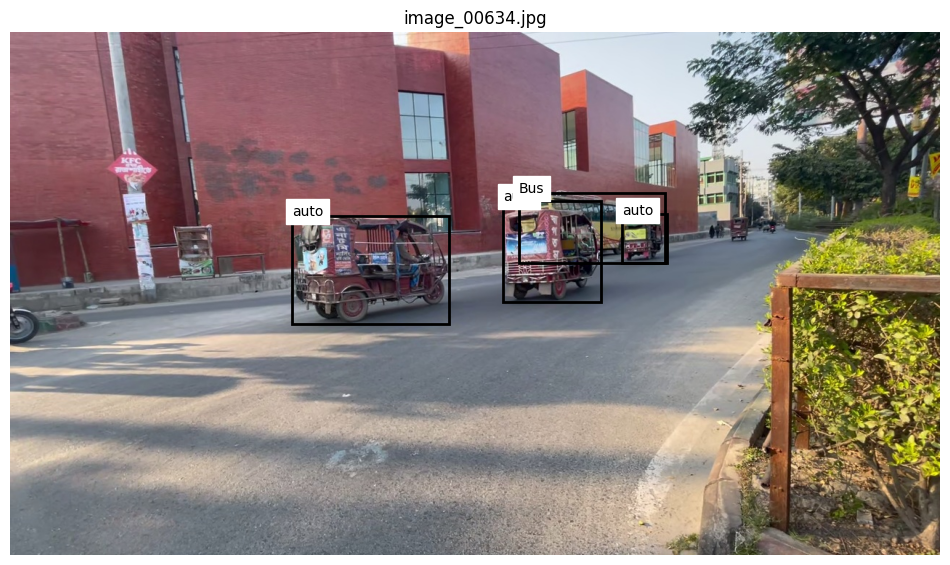

In [26]:
showAnnotation("train")

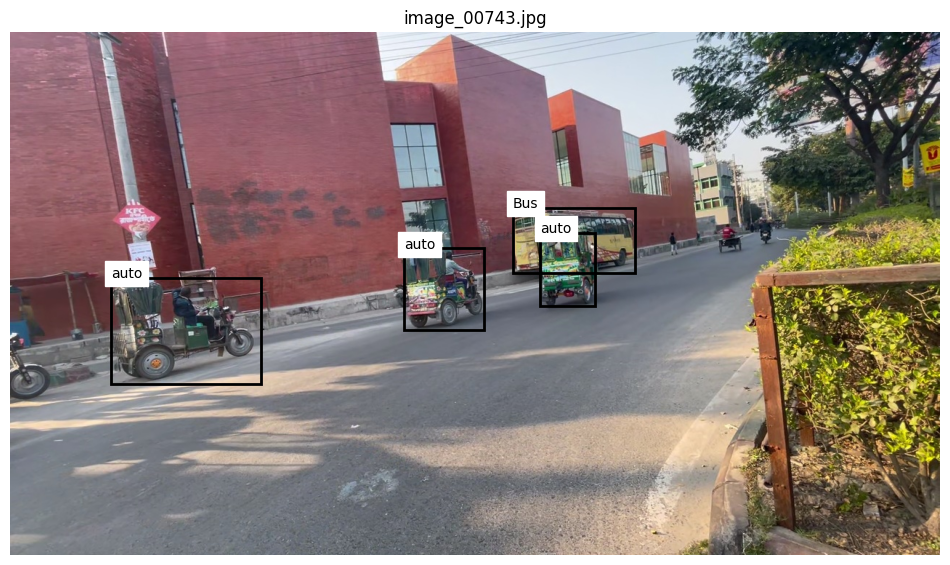

In [27]:
showAnnotation("train")

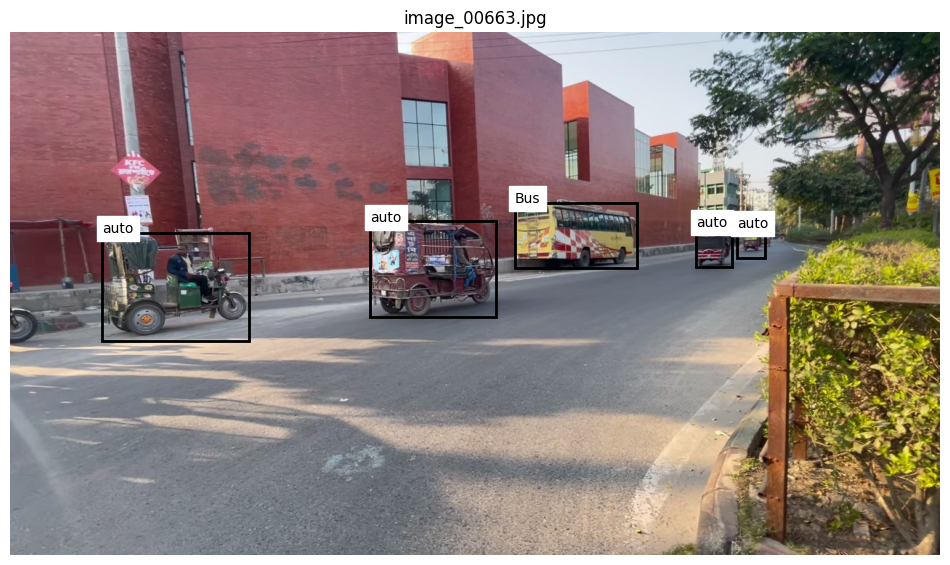

In [28]:
showAnnotation("train")

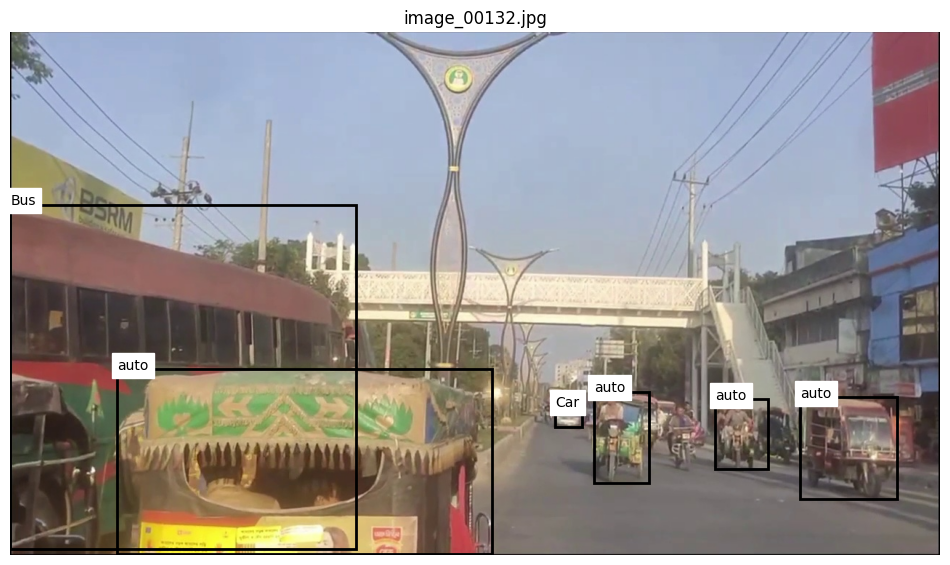

In [29]:
showAnnotation("train")

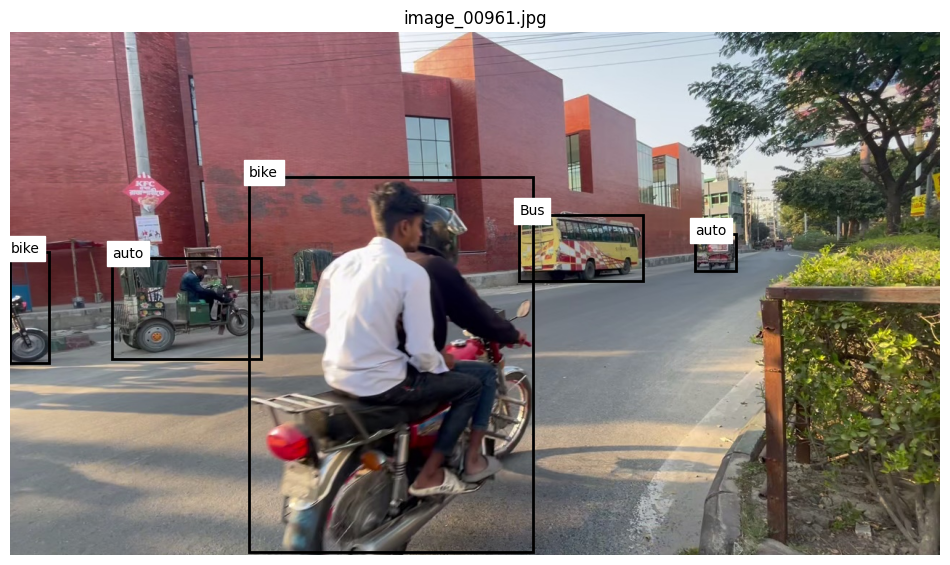

In [30]:
showAnnotation("train")

# Note:
 Retrained so import libraries again as runtime was crashed

# Train YOLOv8 Model

In [9]:
from ultralytics import YOLO
import os
import shutil

yamlPath = "/content/drive/MyDrive/TrafficObj_YOLO/data.yaml"

model = YOLO("yolov8n.yaml")

results = model.train(
    data=yamlPath,
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    name="traffic_from_scratch"
)

Ultralytics 8.4.120 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/TrafficObj_YOLO/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=traffic_f

# Load the Best Trained YOLOv8 Model

In [35]:
bestModelPath = "/content/runs/detect/traffic_from_scratch/weights/best.pt"
model = YOLO(bestModelPath)
print("Model loaded successfully.")

Model loaded successfully.


# Evaluate the Trained Model on the Test Dataset

In [36]:
testResults = model.val(
    data=yamlPath,
    split="test",
    imgsz=640,
    batch=16,
    device=0
)

Ultralytics 8.4.120 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8n summary (fused): 73 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 1.9±2.3 ms, read: 143.9±96.9 MB/s, size: 252.5 KB)
val: Scanning /content/drive/MyDrive/TrafficObj_YOLO/labels/test... 116 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 116/116 109.0it/s 1.1s
val: New cache created: /content/drive/MyDrive/TrafficObj_YOLO/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.5it/s 3.2s
                   all        116        752      0.882      0.579      0.673      0.454
                   Bus         88        116      0.907      0.836      0.928      0.718
                 Truck          4          4          1          0     0.0471     0.0409
                   Car         41         48       0.91       0.75      0.855      0.617
               Bicycle          7         

# Run YOLO Predictions on the Test Images

In [ ]:
testImageDir = os.path.join(
    YOLO_DATASET,
    "images",
    "test"
)

results = model.predict(
    source=testImageDir,
    conf=0.25,
    imgsz=640,
    device=0,
    save=True
)

# Display Sample Prediction Results

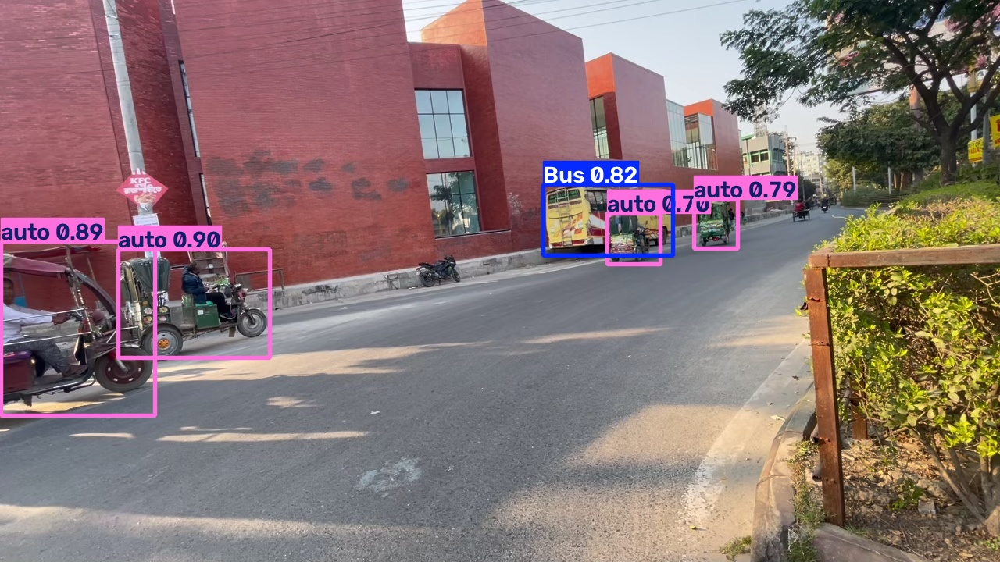

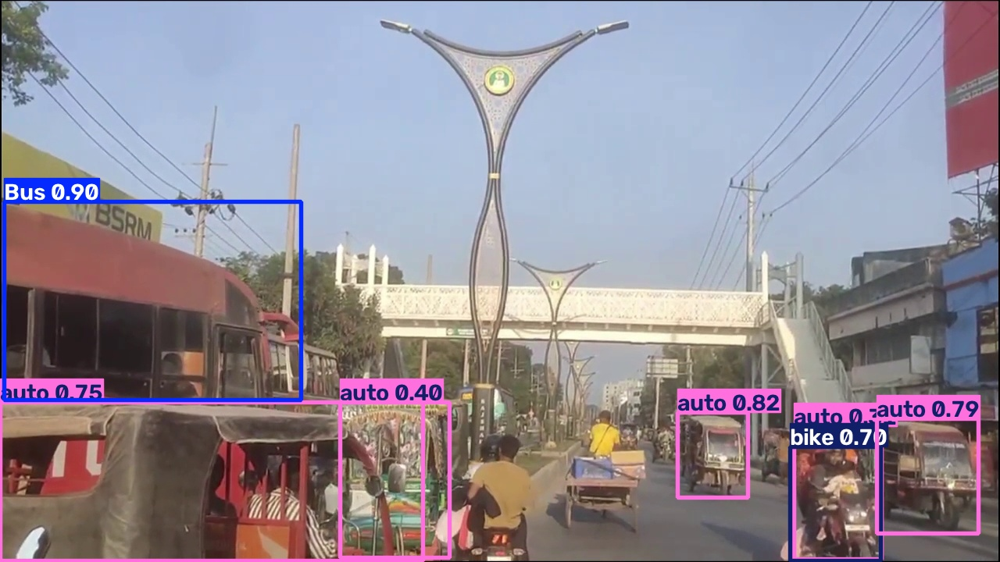

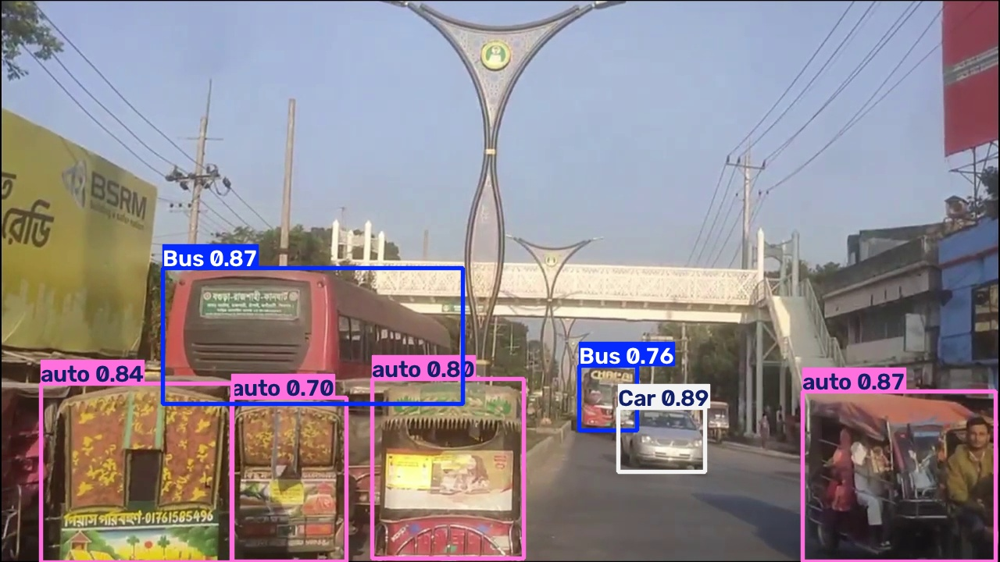

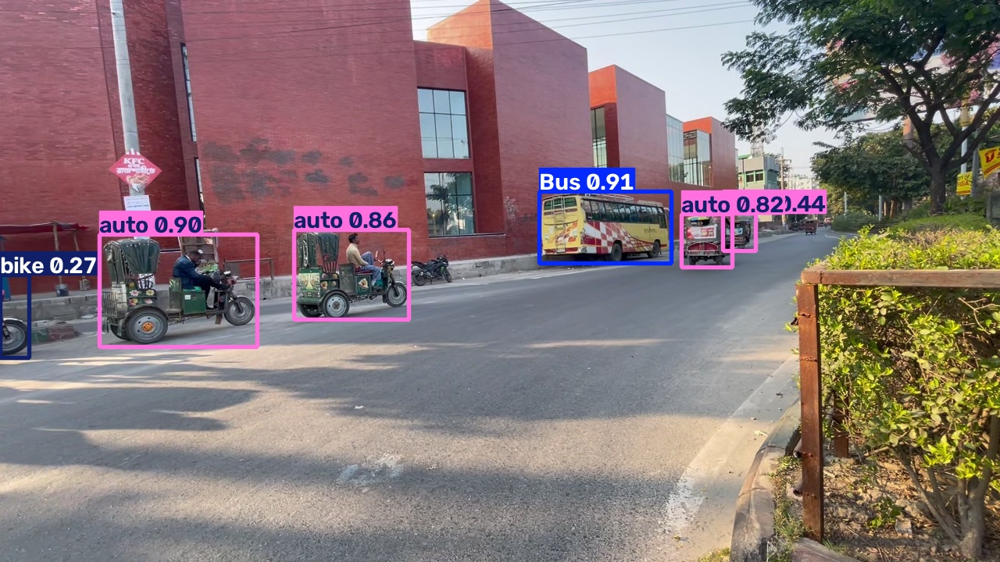

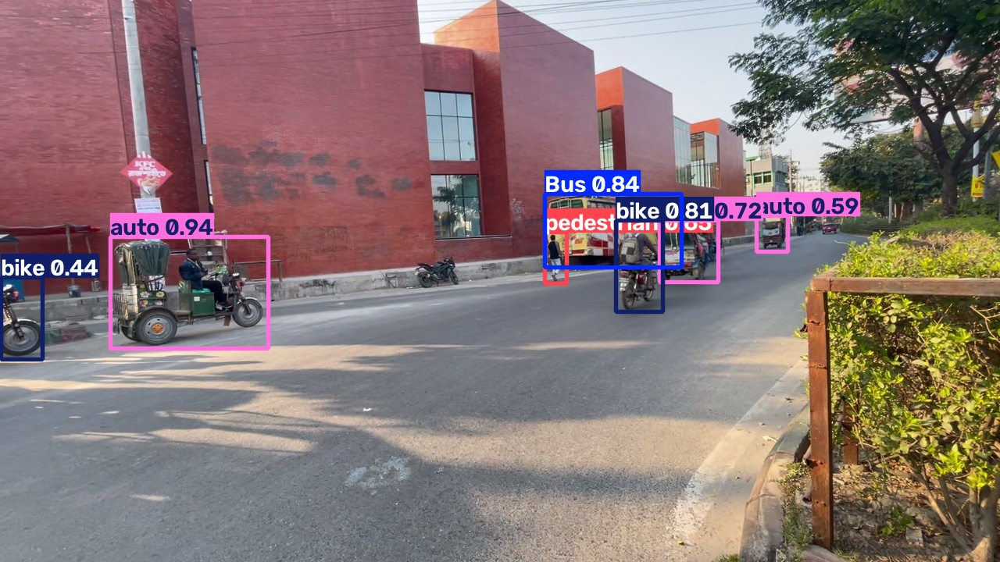

In [38]:
from IPython.display import display
from PIL import Image
import os

predictionDir = "/content/runs/detect/predict"

predictionImages = [
    f for f in os.listdir(predictionDir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

for fileName in predictionImages[:5]:

    imagePath = os.path.join(predictionDir, fileName)

    display(Image.open(imagePath))

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Check System Memory and GPU Status

In [7]:
!free -h
!nvidia-smi

               total        used        free      shared  buff/cache   available
Mem:            12Gi       1.9Gi       7.9Gi       3.0Mi       2.8Gi        10Gi
Swap:             0B          0B          0B
Sun Aug 16 17:04:30 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8        

# Copy the Trained YOLO Model to Google Drive

In [10]:
sourceModel = "/content/runs/detect/traffic_from_scratch/weights/best.pt"
driveModel = "/content/drive/MyDrive/TrafficObj_YOLO/best.pt"
shutil.copy2(sourceModel, driveModel)
print("Model copied successfully!")
print("Exists:", os.path.exists(driveModel))

Model copied successfully!
Exists: True


# Load Trained Model from Google Drive and Verify Class Names

In [11]:
from ultralytics import YOLO

model = YOLO(
    "/content/drive/MyDrive/TrafficObj_YOLO/best.pt"
)

print(model.names)

{0: 'Bus', 1: 'Truck', 2: 'Car', 3: 'Bicycle', 4: 'bike', 5: 'auto', 6: 'pedestrian'}


# Load the Final YOLO Model and Display Class Names

In [12]:
modelPath = "/content/drive/MyDrive/TrafficObj_YOLO/best.pt"
model = YOLO(modelPath)
print("Model loaded successfully.")
print(model.names)

Model loaded successfully.
{0: 'Bus', 1: 'Truck', 2: 'Car', 3: 'Bicycle', 4: 'bike', 5: 'auto', 6: 'pedestrian'}


# Verify Input Traffic Video Exists

In [13]:
videoPath = "/content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4"
import os
print("Video exists:", os.path.exists(videoPath))

Video exists: True


# Run YOLO Object Detection on the Traffic Video

In [14]:
results = model.predict(
    source=videoPath,
    conf=0.25,
    imgsz=640,
    device=0,
    stream=True,
    save=True,
    project="/content/traffic_video_results",
    name="newTrafficVideo"
)

for i, result in enumerate(results):
    if i % 100 == 0:
        print(f"Processed frame: {i}")

print("Video processing completed!")


video 1/1 (frame 1/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 1 Bus, 3 autos, 6.3ms
Processed frame: 0
video 1/1 (frame 2/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 1 bike, 2 autos, 2 pedestrians, 10.9ms
video 1/1 (frame 3/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 3 autos, 2 pedestrians, 6.6ms
video 1/1 (frame 4/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 3 autos, 2 pedestrians, 23.4ms
video 1/1 (frame 5/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 3 autos, 1 pedestrian, 9.3ms
video 1/1 (frame 6/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 1 Bus, 3 autos, 1 pedestrian, 9.5ms
video 1/1 (frame 7/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 1 Bus, 2 autos, 9.5ms
video 1/1 (frame 8/3604) /content/drive/MyDrive/Traffic_Test/newTrafficVideo.mp4: 384x640 1 Bus, 2 autos, 1 pedestrian, 11.3ms
video 1/1 (fra

# Save the Detected Traffic Video to Google Drive

In [16]:
outputDir = "/content/traffic_video_results/newTrafficVideo"

print(os.listdir(outputDir))

outputFiles = [
    f for f in os.listdir(outputDir)
    if f.lower().endswith((".avi", ".mp4", ".mov", ".mkv"))
]

if outputFiles:
    sourceVideo = os.path.join(outputDir, outputFiles[0])

    destinationVideo = "/content/drive/MyDrive/Traffic_Test/detected_newTrafficVideo.avi"

    shutil.copy2(sourceVideo, destinationVideo)

    print("Detected video saved successfully!")
    print(destinationVideo)

else:
    print("No output video found.")

['newTrafficVideo.avi']
Detected video saved successfully!
/content/drive/MyDrive/Traffic_Test/detected_newTrafficVideo.avi
